This notebook explains the pipeline for long axis

In [1]:
from utils import *
import os

Set the data path to the folder that contains directories named after patient ids and MRI vids

In [4]:
DATA_PATH = "E:/UKBB_NIFTI/"
#DATA_PATH="small_dataset/"

# Download your dicom files and convert to nifti

In [2]:
#convert_zip_to_nifti(patients_csv = "/workspace/Milos/TestNifti/patients.csv",  
#                         data_root = "/workspace/Milos/TestNifti/",
#                         output_dir = "/workspace/Milos/UKBB_nifti",
#                         start=0,
#                         end=10000):

In [9]:
image_path= os.path.join(DATA_PATH, "4251166/la_4ch.nii.gz")
nim = nib.load(image_path)
image = nim.get_fdata()
seg_image = np.zeros_like(image)
create_video(image,seg_image,cut=0)

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_asarray.py:85: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


# Segment Nifti files

specify absolute path of your dir

In [ ]:
%cd ukbb_cardiac
!bash -i segment.rc ../small_datasets/
%cd ..

/mnt/c/Users/VukadinoviM/Documents/Beyond_Size/UKB/ukbb_cardiac
Activating environment
# conda environments:
#
base                     /home/milos/miniconda3
ldsc                     /home/milos/miniconda3/envs/ldsc
ukb_seg               *  /home/milos/miniconda3/envs/ukb_seg

Instructions for updating:
non-resource variables are not supported in the long term
2022-05-19 14:41:50.084458: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2022-05-19 14:41:50.102180: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2303760000 Hz
2022-05-19 14:41:50.107162: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x55ab14345990 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2022-05-19 14:41:50.107277: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2022-05-19 14:41:50.11736

In [ ]:
%ls

In [23]:
image_path = os.path.join(DATA_PATH,"4251166/la_4ch.nii.gz")
seg_image_path = os.path.join(DATA_PATH,"4251166/seg4_la_4ch.nii.gz")

In [10]:

nim = nib.load(image_path)
image = nim.get_fdata()
seg_nim = nib.load(seg_image_path)
seg_image = seg_nim.get_fdata()

In [11]:
# min 1699405
create_lv_seg_video(image,seg_image,cut=0)

In [12]:
#mean
create_lv_seg_video(image,seg_image,cut=0)

In [13]:
#max
create_lv_seg_video(image,seg_image,cut=0)

# Extract traits

Here we are going to extract traits and prepare a document for GWAS

## Left Ventricle Shape

In [ ]:
orig_image, masked_image,shape_properties = segment_left_ventricle(image_path,seg_image_path)
create_video_lv(orig_image,masked_image,shape_properties,cut=0)

In [ ]:
shape_properties[0][0][1]/shape_properties[0][0][2]

In [ ]:
shape_properties[0][0][1]/shape_properties[0][0][2]

In [ ]:
shape_properties[0][0][1]/shape_properties[0][0][2]

In [ ]:
orig_image, masked_image,shape_properties = segment_right_ventricle(image_path,seg_image_path)
create_video_lv(orig_image,masked_image,shape_properties,cut=0)

In [ ]:
figs,dists = segment_mitral_valve(image_path,seg_image_path)
create_video_mitral_valve(figs,dists)

## Papillary Muscle Strain

In [53]:
# Read in end-diastolic image 
ed_img_path = os.path.join(DATA_PATH,"1000012/sa_ED.nii.gz")
seg_ed_img_path = os.path.join(DATA_PATH,'1000012/seg_sa_ED.nii.gz')
ed_img, ed_seg, ed_prop = segment_left_ventricle_ED(ed_img_path,seg_ed_img_path)

error: OpenCV(4.4.0) C:\Users\appveyor\AppData\Local\Temp\1\pip-req-build-9d_dfo3_\opencv\modules\imgproc\src\contours.cpp:197: error: (-210:Unsupported format or combination of formats) [Start]FindContours supports only CV_8UC1 images when mode != CV_RETR_FLOODFILL otherwise supports CV_32SC1 images only in function 'cvStartFindContours_Impl'


In [79]:
# Read in end-systolic image 
es_img_path = os.path.join(DATA_PATH,'1000012/sa_ES.nii.gz')
seg_es_img_path = os.path.join(DATA_PATH,'1000012/seg_sa_ES.nii.gz')
es_img, es_seg, es_prop = segment_left_ventricle_ED(es_img_path,seg_es_img_path)

error: OpenCV(4.4.0) C:\Users\appveyor\AppData\Local\Temp\1\pip-req-build-9d_dfo3_\opencv\modules\imgproc\src\contours.cpp:197: error: (-210:Unsupported format or combination of formats) [Start]FindContours supports only CV_8UC1 images when mode != CV_RETR_FLOODFILL otherwise supports CV_32SC1 images only in function 'cvStartFindContours_Impl'


In [40]:
# Calculate papillary muscle length for end-diastolic and -systolic 
pap_es, pap_es_seg, pap_es_dim, pap_length_es = length_papillary(es_img_path,seg_es_img_path)
pap_ed, pap_ed_seg, papa_ed_dim, pap_length_ed = length_papillary(ed_img_path,seg_ed_img_path)
pap_strain = strain_papillary(pap_length_ed,pap_length_es)

7.5
7.5


In [41]:
print('ED & ES Papillary Length: ', pap_length_ed, pap_length_es)

ED & ES Papillary Length:  123.75329637527466 96.73194563388824


In [42]:
print("Papillary strain: ",pap_strain)

Papillary strain:  -0.21834853319337647


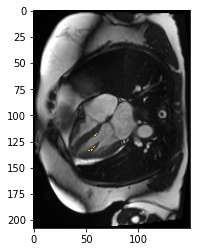

In [43]:
overlap_mask(pap_es.squeeze(),pap_es_seg.squeeze())

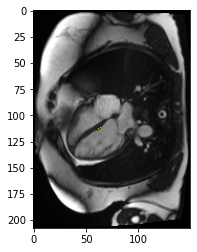

In [44]:
overlap_mask(pap_ed.squeeze(),pap_ed_seg.squeeze())

In [56]:
image_path = os.path.join(DATA_PATH,"1000012/sa.nii.gz")
seg_image_path = os.path.join(DATA_PATH,"1000012/seg_sa.nii.gz")
pap_img,pap_mask,pap_dim = segment_papillary(image_path,seg_image_path)

In [80]:
pap_img.shape

(180, 208, 11, 50)

In [57]:
mass_per_frame = get_papillary_mass(image_path,seg_image_path)

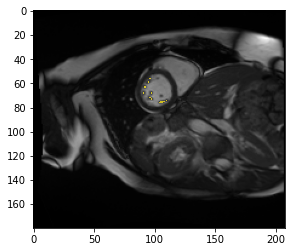

In [82]:
overlap_mask( pap_img[:,:,4,0] , pap_mask[:,:,4,0])

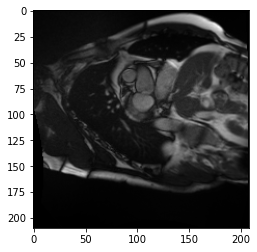

In [52]:
overlap_mask(pap_img[:,:,0,0], pap_mask[:,:,0,0])

In [ ]:
#!bash python iterate.py

In [ ]:
# import pandas as pd
# df = pd.read_csv("LA_traits.csv")
# df

In [ ]:
# with open("mitral_distance.phe",'w') as f:
#     for i in df.index:
#         f.write(f"{df['id'][i]} {df['id'][i]}  {df['mitral_valve_distance_mean'][i]}\n")

# with open("height.phe",'w') as f:
#     for i in df.index:
#         f.write(f"{df['id'][i]} {df['id'][i]}  {df['left_ventricle_height_mean'][i]}\n")

# with open("width.phe",'w') as f:
#     for i in df.index:
#         f.write(f"{df['id'][i]} {df['id'][i]}  {df['left_ventricle_width_mean'][i]}\n")

# with open("angle.phe",'w') as f:
#     for i in df.index:
#         f.write(f"{df['id'][i]} {df['id'][i]}  {df['left_ventricle_angle_mean'][i]}\n")

# GWAS

Steps:

Step 1: Download the data (*.bed, *.fam, *.bim)

    *.bed - individual identifiers and genotypes ( ./gfetch 22418 -c5 )

    *.fam info on the individuals ( ./gfetch 22418 -c5 -m)

    *.bim genetics markers (downloaded using wget)

Step 2: Perform Quality check 7 steps
        * Missingness of SNPs and individuals
        * Sex discrepancy
        * Minor allele frequency 
        * Hardy–Weinberg equilibrium 
        * Heterozygosity
        * Relatedness

Step 3: Stratification ( for example if we have two populations let's say Serbia and US and we put it in the same box, we cannot claim correlation between SNIp and a trait because ethnicity might be underlying factor)

Step 4: Perform GWAS and generate plots

In [ ]:
import IPython
url = 'https://upload.wikimedia.org/wikipedia/commons/1/12/Manhattan_Plot.png'
IPython.display.Image(url, width = 1000)

We take the whole area around detected SNP because of the linkage disequilibrium

Traits we have are:
* mitral valve distance
* height ED
* width ED
* height_ED/width_ED
* angle